# 🐶 Dog Breed Identification

* Source: https://www.kaggle.com/c/dog-breed-identification
* Colab help: 
  - https://colab.research.google.com/notebooks/io.ipynb
  - https://colab.research.google.com/notebooks/intro.ipynb


This notebook builds an End-to-End multiclass image classifier using TensorFlow 2.0 and TensorFlowHub.


## 1. Problem

>Determine the breed of a 🐶 dog in an image.

## 2. Data

Source: [Dog Breed Identification](https://www.kaggle.com/competitions/dog-breed-identification/data)

**File descriptions**:

* **train.zip** - the training set, you are provided the breed for these dogs
* **test.zip** - the test set, you must predict the probability of each breed for each image
sample_submission.csv - a sample submission file in the correct format
* **labels.csv** - the breeds for the images in the train set


## 3. Evaluation

Predictions are evaluated on Multi Class Log Loss between the predicted probability and the observed target.

For each image in the test set, you must predict a probability for each of the different breeds. 
The file with the predictions should contain a header and have the following format:

| id |affenpinscher | afghan_hound | .. | yorkshire_terrier |
| :- | -: | -: | :- | -: |
| 000621fb3cbb32d8935728e48679680e | 0.0083 |0.0 | ... | 0.0083 |


## 4. Features

* It is provided a training set and a test set of images of dogs. 
* Each image has a filename that is its unique id. 
* The dataset comprises 120 breeds of dogs. The goal is to create a classifier capable of determining a dog's breed from a photo. 

Aditional information:
* We are dealing with images (unestructured data) so it is probably best we use deep learning/transfer learning. 
* There are 10,222 images in the training set (labeled) and 10,357 images in the test set (not labeled). 

>The list of breeds is as follows:<br>
>_affenpinscher, afghan_hound, african_hunting_dog, airedale, american_staffordshire_terrier, appenzeller, australian_terrier, basenji, basset, beagle, bedlington_terrier, bernese_mountain_dog, black-and-tan_coonhound, blenheim_spaniel, bloodhound, bluetick, border_collie, border_terrier, borzoi, boston_bull, bouvier_des_flandres, boxer, brabancon_griffon, briard, brittany_spaniel, bull_mastiff, cairn, cardigan, chesapeake_bay_retriever, chihuahua, chow, clumber, cocker_spaniel, collie, curly-coated_retriever, dandie_dinmont, dhole, dingo, doberman, english_foxhound, english_setter, english_springer, entlebucher, eskimo_dog, flat-coated_retriever, french_bulldog, german_shepherd, german_short-haired_pointer, giant_schnauzer, golden_retriever, gordon_setter, great_dane, great_pyrenees, greater_swiss_mountain_dog, groenendael, ibizan_hound, irish_setter, irish_terrier, irish_water_spaniel, irish_wolfhound, italian_greyhound, japanese_spaniel, keeshond, kelpie, kerry_blue_terrier, komondor, kuvasz, labrador_retriever, lakeland_terrier, leonberg, lhasa, malamute, malinois, maltese_dog, mexican_hairless, miniature_pinscher, miniature_poodle, miniature_schnauzer, newfoundland, norfolk_terrier, norwegian_elkhound, norwich_terrier, old_english_sheepdog, otterhound, papillon, pekinese, pembroke, pomeranian, pug, redbone, rhodesian_ridgeback, rottweiler, saint_bernard, saluki, samoyed, schipperke, scotch_terrier, scottish_deerhound, sealyham_terrier, shetland_sheepdog, shih-tzu, siberian_husky, silky_terrier, soft-coated_wheaten_terrier, staffordshire_bullterrier, standard_poodle, standard_schnauzer, 
sussex_spaniel, tibetan_mastiff, tibetan_terrier, toy_poodle, toy_terrier, vizsla, walker_hound, weimaraner, welsh_springer_spaniel, west_highland_white_terrier, whippet, wire-haired_fox_terrier, yorkshire_terrier_

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#To delete a folder
#!rm -rf "./data/"

In [ ]:
# # To unzip a file
# !unzip "/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/"

### Get out ourworkspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we are using a GPU ✅

In [ ]:
# # Import TF2.x --> When you receive a msg that there is a new version --> Only for Colab
# try:
#   # %tensorflow_version only exits in Colab
#   %tensorflow_version 2.x
# except Exception:
#   pass

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub

print('TF version: ', tf.__version__)
print('TF Hub version: ', hub.__version__)

# Check for GPU availability
# To make GPU available: Go to Runtime Menu --> Change runtime type and select GPU for Hardware accelerator
print("GPU", "Available!" if tf.config.list_physical_devices("GPU") else 'Not available!')

TF version:  2.8.2
TF Hub version:  0.12.0
GPU Available!


In [ ]:
# Confirming that we are connected to the GPU with tensorflow
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print("""
  GPU device not found!
  This error most likely means that this notebook is not configured to use a 
  GPU. Change this in Notebook Seetings via the command palette (cmd/ctrl-shift-p)
  or the Edit menu.
  """)
  #raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
def cpu():
  with tf.device('/cpu:0'):
    random_image_cpu = tf.random.normal((100, 100, 100, 3))
    net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
    return tf.math.reduce_sum(net_cpu)
  return None

def gpu():
  with tf.device('/cpu:0'):
    random_image_cpu = tf.random.normal((100, 100, 100, 3))
    net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
    return tf.math.reduce_sum(net_cpu)
  return None

In [ ]:
import timeit
# We run each op once to warn up; see: https://stackoverflow.com/a/45067900
cpu()
gpu()

# Run the op several times
print('Time(s) to convolve 32x7x7x3 filter over random 100x100x100x3 images '
      '(batch x height x width x channel). Sum of ten runs.')

cpu_time = timeit.timeit('cpu()', number=10, setup='from __main__ import cpu')
print('CPU (s): ', cpu_time)

gpu_time = timeit.timeit('gpu()', number=10, setup='from __main__ import gpu')
print('GPU (s): ', gpu_time)

print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

Time(s) to convolve 32x7x7x3 filter over random 100x100x100x3 images (batch x height x width x channel). Sum of ten runs.
CPU (s):  2.764943082000002
GPU (s):  2.6388778339999988
GPU speedup over CPU: 1x


### Get our data ready

Which all machine learning models, our data has to be in numerical format. So that's what we will be doing first.
Turning our images into Tensors (numerical representation).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/labels.csv')
df

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
df.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
# How many images are there for each bread?
df.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

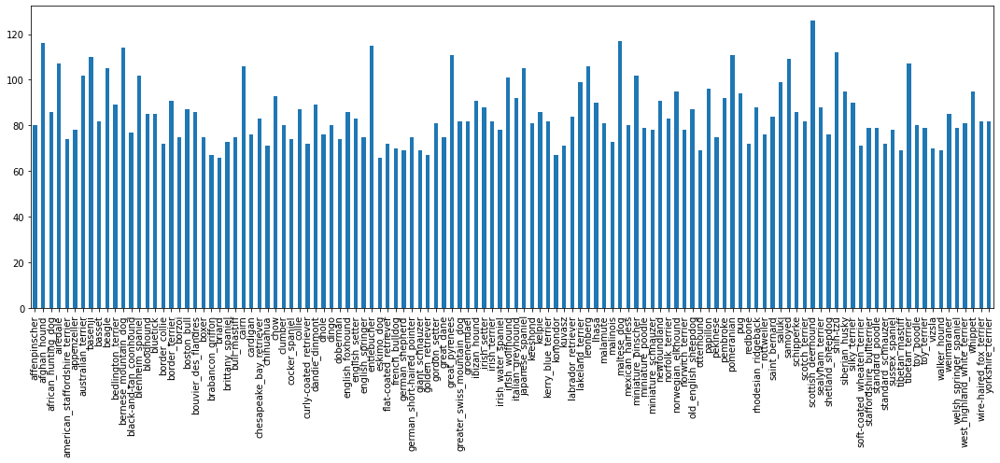

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

df.breed.value_counts().sort_index().plot(figsize=(15,7), kind='bar', rot=90)
#plt.gca().invert_xaxis()
plt.tight_layout()

In [ ]:
df.breed.value_counts().median()

82.0

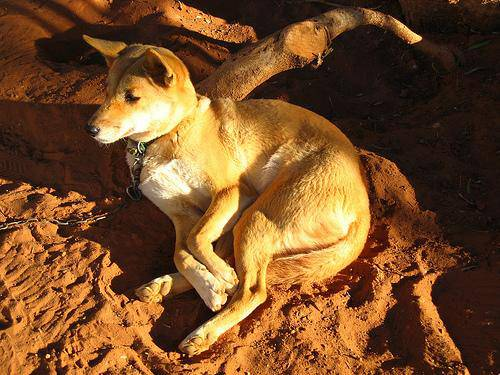

In [ ]:
# Let's view an image
from IPython.display import Image

Image('/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Join images with their labels

Let's get a a list of all of our images file pathnames.

In [ ]:
# Create pathname's from images IDs
pd.set_option('display.max_colwidth', None)
df['image_path'] = '/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/train/' + df.id + '.jpg' 
df.head(2)

,id,breed,image_path
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg


In [ ]:
df[:2].image_path.tolist()

['/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg']

In [ ]:
# Checking the corresponds between the ids and files we have in train folder
import os
import numpy as np

training_files = os.listdir('/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/train')

if len(training_files) != len(df.id):
   print('The total files does not match with the total ids')

if np.sum(np.array(sorted(training_files)) == df.id.sort_values() + '.jpg') != len(training_files):
  print('Some files are missing...')

print('Validation completed!')

Validation completed!


tibetan_mastiff


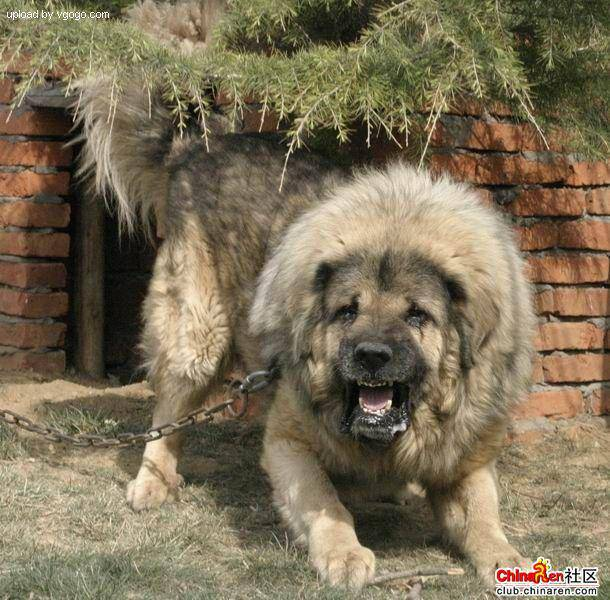

In [ ]:
print(df.breed[9000])
Image(df.image_path[9000])

In [ ]:
# Find unique labels
len(df.breed.unique())

120

In [ ]:
df.breed[0] == df.breed.sort_values().unique()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
df_labels = pd.get_dummies(df.breed)
print(df_labels.to_numpy())
df_labels.head(2)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
n = 0
print('Label to find         : ', df.breed[n])
print('Index in unique labels: ', np.where(df.breed.sort_values().unique() == df.breed[n]))
print('Index in bool array   : ', df_labels.to_numpy()[n].argmax())
print('Bool array            : \n', df_labels.to_numpy()[n])

Label to find         :  boston_bull
Index in unique labels:  (array([19]),)
Index in bool array   :  19
Bool array            : 
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Getting X & y

In [ ]:
# Setup X and y
X = df.image_path
y = pd.get_dummies(df.breed)

X.shape, y.shape

((10222,), (10222, 120))

In [ ]:
# Split into train & test
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
X_train.shape, X_valid.shape, y_train.shape, y_valid.shape

((8177,), (2045,), (8177, 120), (2045, 120))

In [ ]:
# Proportion in training set
pd.DataFrame(y_train).sum()/len(y_train)

affenpinscher                     0.007827
afghan_hound                      0.011373
african_hunting_dog               0.008438
airedale                          0.010395
american_staffordshire_terrier    0.007215
                                    ...   
welsh_springer_spaniel            0.007705
west_highland_white_terrier       0.007949
whippet                           0.009294
wire-haired_fox_terrier           0.008071
yorkshire_terrier                 0.008071
Length: 120, dtype: float64

In [ ]:
# Proportion in total population
pd.DataFrame(y).sum()/len(y)

affenpinscher                     0.007826
afghan_hound                      0.011348
african_hunting_dog               0.008413
airedale                          0.010468
american_staffordshire_terrier    0.007239
                                    ...   
welsh_springer_spaniel            0.007728
west_highland_white_terrier       0.007924
whippet                           0.009294
wire-haired_fox_terrier           0.008022
yorkshire_terrier                 0.008022
Length: 120, dtype: float64

### Turning images into tensors

Steps to preprocess images into Tensors:
1. Take an image filepath as input.
2. Use TensorFlow to read the file and save it to a variable, `image`.
3. Turn out the `image` (jpg) into Tensors.
4. Normalize the `image` (convert our color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224).
6. Return the modified `image`.

255 0


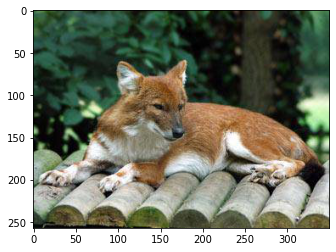

In [ ]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(df.image_path[42])
print(image.max(), image.min())
plt.imshow(image)

In [ ]:
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [ ]:
image = tf.io.read_file(df.image_path[42])
image = tf.image.decode_jpeg(image, channels=3)
image = tf.image.convert_image_dtype(image, tf.float32)
image

<tf.Tensor: shape=(257, 350, 3), dtype=float32, numpy=
array([[[0.34509805, 0.5411765 , 0.34117648],
        [0.29411766, 0.4901961 , 0.2901961 ],
        [0.24705884, 0.43529415, 0.23137257],
        ...,
        [0.29803923, 0.5254902 , 0.32941177],
        [0.29803923, 0.5254902 , 0.3372549 ],
        [0.29411766, 0.52156866, 0.33333334]],

       [[0.2784314 , 0.47058827, 0.28627452],
        [0.25490198, 0.45098042, 0.25882354],
        [0.24313727, 0.43921572, 0.24705884],
        ...,
        [0.28627452, 0.5137255 , 0.3254902 ],
        [0.2901961 , 0.5176471 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177]],

       [[0.21176472, 0.41176474, 0.2509804 ],
        [0.21960786, 0.41960788, 0.25882354],
        [0.24313727, 0.4431373 , 0.28235295],
        ...,
        [0.27450982, 0.49803925, 0.32156864],
        [0.2784314 , 0.5019608 , 0.3254902 ],
        [0.28235295, 0.5058824 , 0.32941177]],

       ...,

       [[0.00784314, 0.04313726, 0.03921569],
        [0.01

In [ ]:
# Define image size
IMG_SIZE = 224 # Size attached to the machine learning model

# Create a function for preprocess the images
def process_image(image_path):
  """
  Take imagepath and transform it into a Tensor.
  """
  image = tf.io.read_file(image_path) # Read in an image file
  image = tf.image.decode_jpeg(image, channels=3) # Turn the jpg image into numerical tensor with 3 colors channel (R, G, B)
  image = tf.image.convert_image_dtype(image, tf.float32) # Normalize the image, from 0-255 to 0-1
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE]) # Resize the image to our desired value (224, 224)
  return image

### Turn our data into batches

Why turn our data into batches?

Let's say you are trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 images (batch size) at a time (batch size can manually be adjusted).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [ ]:
# Create a function to return the tensor tuples
def get_image_label(image_path, label):
  """
  Takes an image path and label and return a tuple of the preprocess image path and its label.
  """
  return process_image(image_path), label


In [ ]:
get_image_label(X_train[0], tf.constant(y.to_numpy()[0]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5705322 , 0.33588538, 0.15008473],
         [0.66901225, 0.4601166 , 0.26022965],
         [0.61062384, 0.43763596, 0.21601713],
         ...,
         [0.8182312 , 0.7297958 , 0.26963907],
         [0.72454786, 0.6059109 , 0.2653059 ],
         [0.7494603 , 0.6252918 , 0.32456532]],
 
        [[0.6761415 , 0.4733761 , 0.30642927],
         [0.5672121 , 0.38192675, 0.20349538],
         [0.5883547 , 0.4322571 , 0.2403155 ],
         ...,
         [0.9326942 , 0.8260503 , 0.41093278],
         [0.86072475, 0.74250627, 0.3694122 ],
         [0.76781666, 0.6461604 , 0.29291284]],
 
        [[0.46350825, 0.29595745, 0.1536156 ],
         [0.42554107, 0.27039403, 0.12009468],
         [0.7887875 , 0.6547362 , 0.49015   ],
         ...,
         [0.89372385, 0.7696401 , 0.41811958],
         [0.88609535, 0.7585918 , 0.36495727],
         [0.8243601 , 0.69494826, 0.2930575 ]],
 
        ...,
 
        [[0.7344025 , 0.4716574 

In [ ]:
# Define the batch size
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffle the data if it is training data but does not shuffle if it is validate data.
  Also accepts test data as input (no labels)
  """
  # When data is test_data, it will not have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths no labels.
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
    
  # When data is valid_data, we do not need to shuffle
  elif valid_data:
    print('Creating valid data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    
  else: 
    print('Creating training data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size=len(X)) # Shuffling before mapping
  
  data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Set numbers of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max: 10222, step: 1}

In [ ]:
# Setup X and y
X = df.image_path
y = pd.get_dummies(df.breed)

Xdata = X.tolist()[:NUM_IMAGES]
ydata = y.values.tolist()[:NUM_IMAGES]

# Split into train and valid sets
X_train, X_valid, y_train, y_valid = train_test_split(Xdata, ydata, test_size=0.2, stratify=ydata, random_state=42)

# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_valid, y_valid, valid_data=True)

Creating training data batches...
Creating valid data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)))

#### Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
# Create a function for viewing images in a data batch
unique_breeds = df.breed.sort_values().unique()

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(15, 15))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image 
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

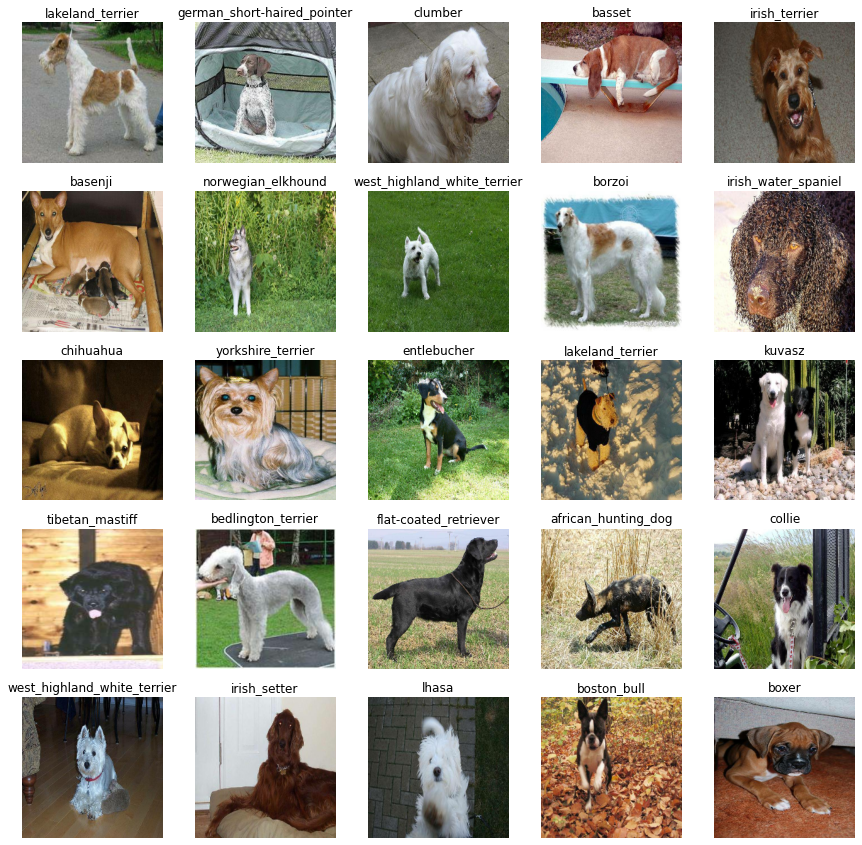

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

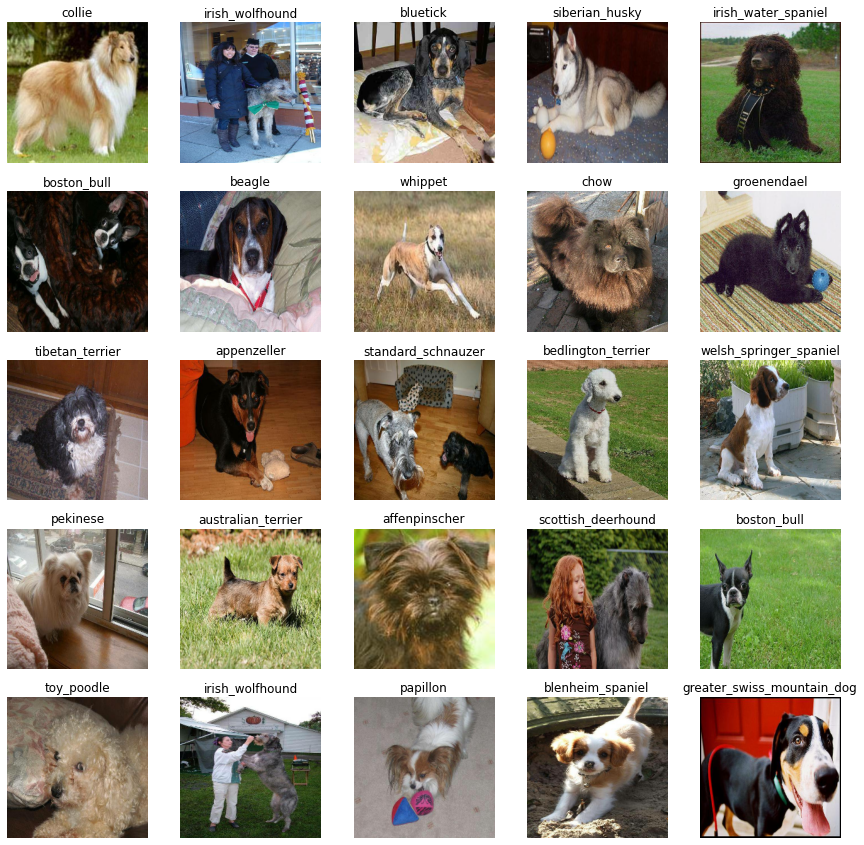

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(valid_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_valid, y_valid, valid_data=True)

Creating training data batches...
Creating valid data batches...


# 4. Model

Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile( 
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
# Fit the model
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

**TensorBoard Callback**

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard logs
  logdir = os.path.join('/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)


#### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

### Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type: 'slider', min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "Available!" if tf.config.list_physical_devices("GPU") else 'Not available!')

GPU Available!


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 170s 6s/step - loss: 4.6147 - accuracy: 0.1075 - val_loss: 3.0211 - val_accuracy: 0.3650
Epoch 2/100
25/25 [==============================] - 3s 138ms/step - loss: 1.6893 - accuracy: 0.6675 - val_loss: 1.7812 - val_accuracy: 0.6000
Epoch 3/100
25/25 [==============================] - 4s 150ms/step - loss: 0.5715 - accuracy: 0.9325 - val_loss: 1.3761 - val_accuracy: 0.6950
Epoch 4/100
25/25 [==============================] - 4s 166ms/step - loss: 0.2590 - accuracy: 0.9875 - val_loss: 1.2196 - val_accuracy: 0.7050
Epoch 5/100
25/25 [==============================] - 4s 172ms/step - loss: 0.1494 - accuracy: 0.9962 - val_loss: 1.1484 - val_accuracy: 0.6900
Epoch 6/100
25/25 [==============================] - 4s 147ms/step - loss: 0.1002 - accuracy: 1.0000 - val_loss: 1.1029 - val_accuracy: 0.7100
Epoch 7/100
25/25 [==============================]

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

#### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/Neural\ Networks\ \|\ TensorFlow/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model 

In [ ]:
valid_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 1s 105ms/step


array([[1.3227512e-03, 1.4848432e-03, 1.3978640e-03, ..., 7.2200451e-04,
        4.7984769e-04, 3.6766761e-04],
       [2.3476083e-05, 6.6602050e-05, 2.2139229e-05, ..., 5.1344738e-05,
        2.5134932e-03, 4.1467811e-05],
       [3.5868629e-06, 6.2709810e-06, 7.8914863e-06, ..., 8.8258748e-06,
        5.1245581e-05, 2.6109981e-05],
       ...,
       [1.5808736e-04, 7.2318333e-04, 3.7480443e-04, ..., 6.1724216e-02,
        5.8820806e-05, 1.2444305e-04],
       [3.0634235e-04, 1.3686641e-03, 4.5299363e-05, ..., 1.6079313e-03,
        1.4201727e-03, 9.2274713e-05],
       [4.4182530e-03, 2.7695405e-03, 5.5810019e-06, ..., 8.7292065e-05,
        3.3454795e-04, 1.4798738e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
breed_predicted = predictions.argmax(axis=1)
breed_predicted, breed_predicted.shape 

(array([ 33,  97,  15,  71,  58,  19,   8, 117, 108,  54, 109,  75, 106,
         10, 115,  85,  17,   0,  97,  19, 110,  97,  84,  13,  42, 106,
         93,  22,  93,  37,  69,  97, 100, 100, 119,   7,  61,  31,  49,
          1,  79,  94,  98,  57,  74,  88,  66,  80,  33,  27,  17,  87,
         84,  14, 100, 113,   3,  82,  81, 114,  20,  95,   8, 105,  95,
        119,  56,  85,  71,  57,  60,  73,  87,  46,  45,  94,  14,  92,
          9,  25,  62,  66,  11,  19,  67,  28,  73,  52, 114,  37,  49,
        119,   3,   1,  55,  89,  96, 115,  31,  11,  49,  72,  64,  36,
         20,   0,  78,  51,  40,  14,  44,  93,  37,   8, 118,  75,  13,
         10,  40,  26,  15, 115,  27,  64,   6,  67,  89,   2,  75,   7,
         35, 109,   7,  58, 104,  79,   8, 101,  17, 119,  38,  60,  26,
         60,  89,  56,  65,  42,  70, 119,   8,  69,  39, 100,  50,  52,
         11,  20, 111,  96,   1,  84, 118,  13,  68,  83,  20,   2,  54,
         37,  99,  16,  11, 116,  42,  18, 101,  12

In [ ]:
unique_breeds[breed_predicted]

array(['collie', 'scottish_deerhound', 'bluetick', 'malamute',
       'irish_water_spaniel', 'boston_bull', 'basset', 'whippet',
       'tibetan_mastiff', 'groenendael', 'tibetan_terrier',
       'miniature_pinscher', 'standard_schnauzer', 'bedlington_terrier',
       'welsh_springer_spaniel', 'pekinese', 'border_terrier',
       'affenpinscher', 'scottish_deerhound', 'boston_bull', 'toy_poodle',
       'scottish_deerhound', 'papillon', 'blenheim_spaniel',
       'entlebucher', 'standard_schnauzer', 'saluki', 'brabancon_griffon',
       'saluki', 'dingo', 'leonberg', 'scottish_deerhound', 'shih-tzu',
       'shih-tzu', 'yorkshire_terrier', 'basenji', 'japanese_spaniel',
       'clumber', 'golden_retriever', 'afghan_hound', 'norfolk_terrier',
       'samoyed', 'sealyham_terrier', 'irish_terrier', 'mexican_hairless',
       'pug', 'kuvasz', 'norwegian_elkhound', 'collie', 'cardigan',
       'border_terrier', 'pomeranian', 'papillon', 'bloodhound',
       'shih-tzu', 'walker_hound', 'aire

Predicted: collie (64.13%) | Real label: collie.


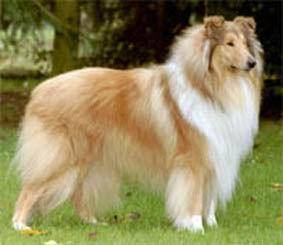

In [ ]:
# Exploring again in the dataset
n = 0
print('Predicted: {} ({:.2f}%) | Real label: {}.'.format(unique_breeds[breed_predicted[n]],
                                                         predictions[n].max()*100,
                                                         unique_breeds[np.array(y_valid[n]).argmax()]))
Image(X_valid[n])

In [ ]:
true_labels = np.array(y_valid).argmax(axis=1)
np.mean(breed_predicted == true_labels)

0.735

In [ ]:
# We can unbatch our batch data
valid_data_images, valid_data_labels = zip(*(valid_data.unbatch().as_numpy_iterator()))
valid_data_labels = np.array(valid_data_labels).argmax(axis=1)
valid_data_images = np.array(valid_data_images)

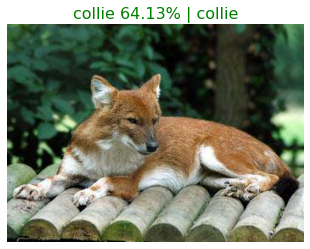

In [ ]:
# Let´s visualize them using matplotlib
n = 0
pred_prob, pred_label = predictions[n].max()*100, unique_breeds[predictions[n].argmax()]
true_label, true_image = unique_breeds[valid_data_labels[n]], valid_data_images[n]

# Plot image & remove ticks
plt.imshow(image)
plt.axis('off')

# Change the colour of the title depending on if the prediction is right or wrong
color = "green" if pred_label == true_label else "red"

# Change plot title to be predicted, probability of prediction and truth label
plt.title("{} {:.2f}% | {}".format(pred_label, pred_prob, true_label), color=color, fontsize=16);
plt.show()

In [ ]:
# Define a function to plot 10 predicted breeds
def plotting_10_predicted_breeds(predicted_index, title, predicted_label, predicted_proba, valid_data_labels, valid_data_images, unique_breeds):
  pred_labels, pred_probas = predicted_label[predicted_index], predicted_proba[predicted_index]
  true_labels, true_images = unique_breeds[valid_data_labels[predicted_index]], valid_data_images[predicted_index]

  # Setup the figure
  fig = plt.figure(figsize=(18, 8))

  # Loop through 10 (for displaying 10 images)
  for i in range(10):
    # Create subplots (2 rows, 5 columns)
    ax = plt.subplot(2, 5, i+1)
    
    # Display an image 
    plt.imshow(true_images[i])
    plt.axis("off")

    # Change the colour of the title depending on if the prediction is right or wrong
    color = "green" if pred_labels[i] == true_labels[i] else "red"

    # Change plot title to be predicted, probability of prediction and truth label
    plt.title("{} {:.2f}%\n({})".format(pred_labels[i], pred_probas[i], true_labels[i]), color=color);
  
  fig.suptitle(title, fontweight='bold')
  plt.subplots_adjust(left=None, right=None, bottom=None, top=None, hspace=1, wspace=.4);
  fig.tight_layout(rect=[0, 0.03, 1, 0.95]) #(left, bottom, right, top)
  plt.show()

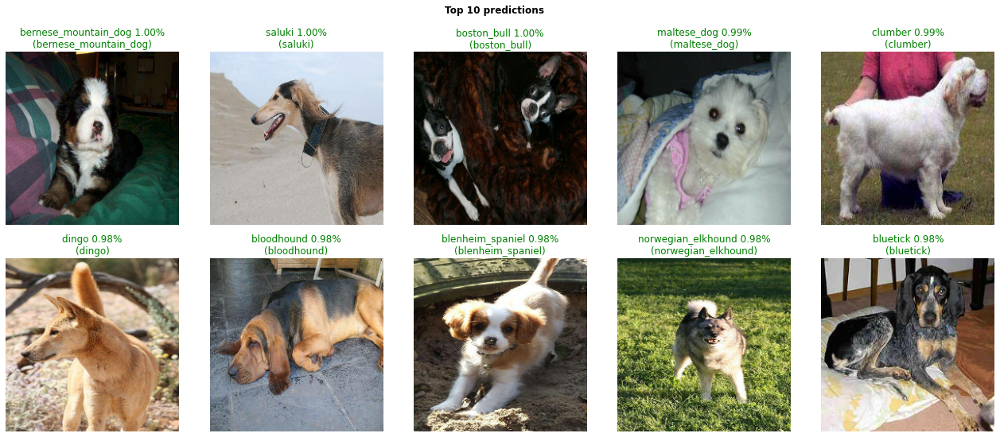

In [ ]:
# Let's plot the top 10 predictions
predicted_label = unique_breeds[predictions.argmax(axis=1)]
predicted_proba = predictions.max(axis=1)

top_10_breed_predicted = np.argsort(predicted_proba)[::-1][:10]

plotting_10_predicted_breeds(top_10_breed_predicted, 'Top 10 predictions', 
                             predicted_label, predicted_proba, 
                             valid_data_labels, valid_data_images, 
                             unique_breeds)

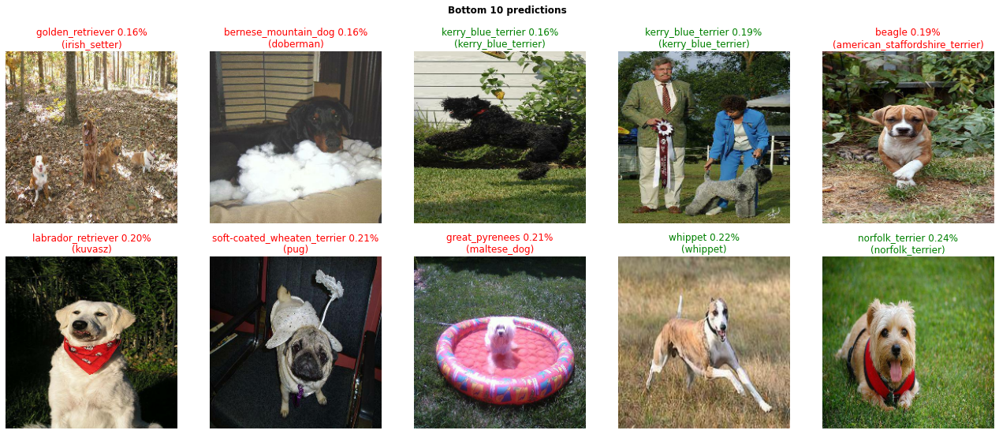

In [ ]:
# Let's plot the bottom 10 predictions
top_10_breed_predicted = np.argsort(predicted_proba)[:10]

plotting_10_predicted_breeds(top_10_breed_predicted, 'Bottom 10 predictions', 
                             predicted_label, predicted_proba, 
                             valid_data_labels, valid_data_images, 
                             unique_breeds)

In [ ]:
# Let's define a function to plot the top 10 predictions in a n item.
def plloting_pred_conf(n, predictions, valid_data_labels, valid_data_images, unique_breeds):
  # Get the item
  pred_label, pred_probas = unique_breeds[predictions.argmax(axis=1)][n], predictions[n]
  true_label, true_image = unique_breeds[valid_data_labels[n]], valid_data_images[n]
  
  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_probas.argsort()[-10:][::-1]
  top_10_pred_values = pred_probas[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  fig, ax = plt.subplots(1, 2, figsize=(10, 6))
  top_plot = ax[0].bar(top_10_pred_labels, top_10_pred_values, color="gray")
  ax[0].tick_params(axis='x', rotation=90)

  # Change color of true label
  result_preds = (top_10_pred_labels == true_label)
  if result_preds.any():
    top_plot[np.argmax(result_preds)].set_color("green")
  
  # Plot image & remove ticks
  ax[1].imshow(true_image)
  ax[1].axis('off')

  # Change the colour of the title depending on if the prediction is right or wrong
  color = "green" if pred_label == true_label else "red"
  fig.suptitle("{} {:.2f}% | {}".format(pred_label, top_10_pred_values[0], true_label), color=color, fontsize=16);

  plt.subplots_adjust(left=None, right=None, bottom=None, top=None, hspace=1, wspace=.4);
  fig.tight_layout(rect=[0, 0.03, 1, 0.95]) #(left, bottom, right, top)
  plt.show()

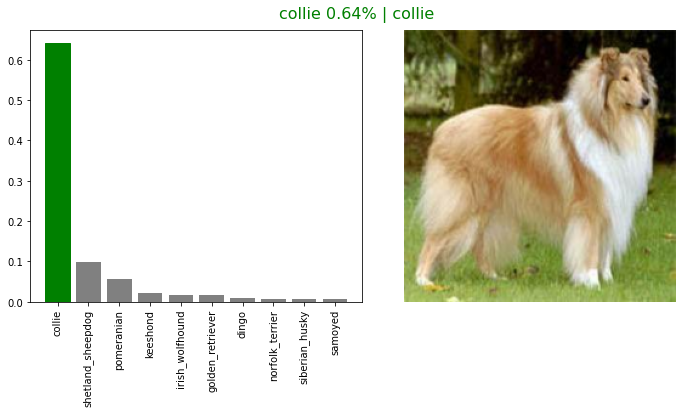

In [ ]:
# Let's plot the confidence for an item
n=0
plloting_pred_conf(n, predictions, valid_data_labels, valid_data_images, unique_breeds)

In [ ]:
# Let's define a function to plot the top 10 predictions of a random 6 items.
def plloting_pred_conf_for_6_items(predictions, valid_data_labels, valid_data_images, unique_breeds):
  # Get the item
  n_items = np.random.randint(0, len(predictions), 6)
  pred_labels, pred_probas = unique_breeds[predictions.argmax(axis=1)][n_items], predictions[n_items]
  true_labels, true_images = unique_breeds[valid_data_labels[n_items]], valid_data_images[n_items]
  
  fig, ax = plt.subplots(3, 4, figsize=(18, 18))
  n_axes = [[[0,0], [0,1]], [[0,2], [0,3]], 
            [[1,0], [1,1]], [[1,2], [1,3]], 
            [[2,0], [2,1]], [[2,2], [2,3]]]
  for i in range(6):
    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_probas[i].argsort()[-10:][::-1]
    top_10_pred_values = pred_probas[i][top_10_pred_indexes]
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = ax[n_axes[i][0][0],n_axes[i][0][1]].bar(top_10_pred_labels, top_10_pred_values, color="gray")
    ax[n_axes[i][0][0],n_axes[i][0][1]].tick_params(axis='x', rotation=90)

    # Change color of true label
    result_preds = (top_10_pred_labels == true_labels[i])
    if result_preds.any():
      top_plot[np.argmax(result_preds)].set_color("green")
  
    # Change the colour of the title depending on if the prediction is right or wrong
    color = "green" if pred_labels[i] == true_labels[i] else "red"
    ax[n_axes[i][0][0],n_axes[i][0][1]].set_title("{}:{} {:.2f}% | {}".format(n_items[i], pred_labels[i], top_10_pred_values[0], true_labels[i]), color=color);

    # Plot image & remove ticks
    ax[n_axes[i][1][0],n_axes[i][1][1]].imshow(true_images[i])
    ax[n_axes[i][1][0],n_axes[i][1][1]].axis('off')

    
  fig.tight_layout()
  plt.show()

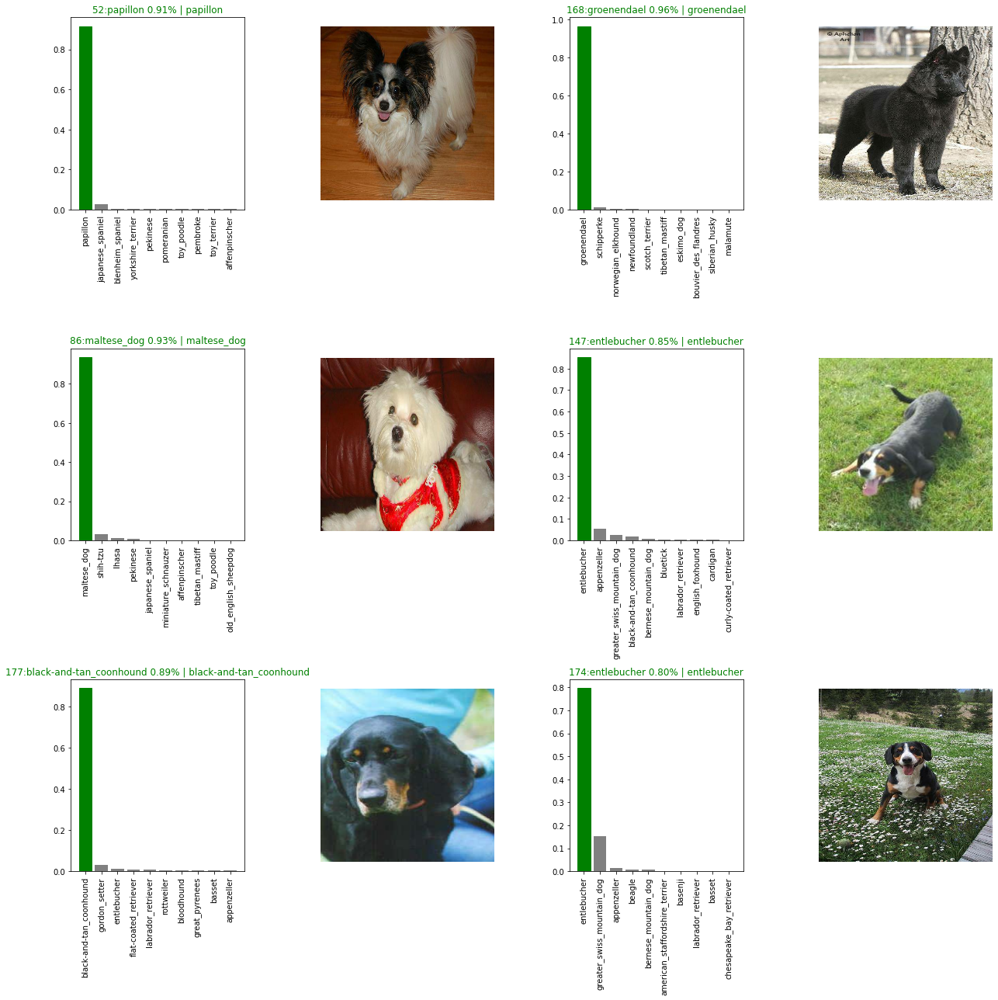

In [ ]:
plloting_pred_conf_for_6_items(predictions, valid_data_labels, valid_data_images, unique_breeds)

## Evaluate the model

In [ ]:
list(zip(model.metrics_names, model.evaluate(valid_data)))

7/7 [==============================] - 1s 88ms/step - loss: 1.0098 - accuracy: 0.7350


[('loss', 1.0098185539245605), ('accuracy', 0.7350000143051147)]

In [ ]:
pred_values = predictions.argmax(axis=1)
true_values = valid_data_labels
cm = np.array(tf.math.confusion_matrix(true_values, pred_values, num_classes=len(unique_breeds)))
cm

array([[2, 0, 0, ..., 0, 0, 0],
       [0, 2, 0, ..., 0, 0, 0],
       [0, 0, 2, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 2, 0],
       [0, 0, 0, ..., 0, 0, 2]], dtype=int32)

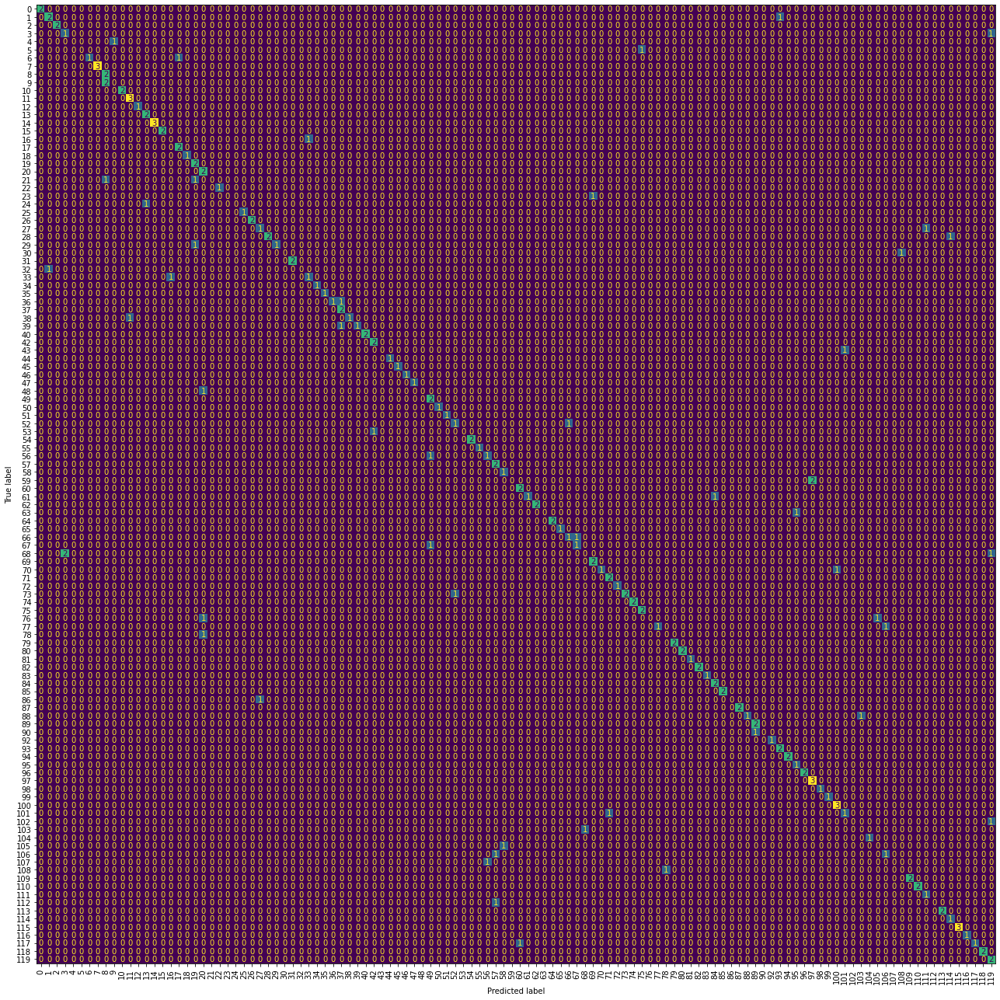

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay

fig, ax = plt.subplots(figsize=(18,18))
ConfusionMatrixDisplay.from_predictions(true_values, pred_values, ax=ax, colorbar=False)
ax.tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/models/20221010-23481665445716-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/models/20221010-23481665445716-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/models/20221007-08401665132013-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/models/20221007-08401665132013-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(valid_data) 

7/7 [==============================] - 1s 79ms/step - loss: 1.0098 - accuracy: 0.7350


[1.0098185539245605, 0.7350000143051147]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.0828 - accuracy: 0.6850


[1.082803726196289, 0.6850000023841858]